In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/kko1/.pyen

Running scvelo 0.3.2 (python 3.8.19) on 2025-01-23 11:41.


In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


scanpy==1.9.8 anndata==0.9.2 umap==0.5.6 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.11.8 pynndescent==0.5.13


In [4]:
import os
os.chdir('/mnt/d/KP/EKP_RKP')

In [5]:
import scanpy.external as sce

# Processed

In [70]:
processed= sc.read('Tcell_isolated_04-30-24.h5ad')
processed

AnnData object with n_obs × n_vars = 699 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_rank_fgsea', 'neighbors', 'pca', 'tissue_1_colors', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
processed.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt,n_counts,celltype
AAACGCTCAGCTATAC-1-0,1108,1106,1432.900269,0.767421,0.053557,allograft,EKP,0,0,Immune,49.807819,3.476014,0.000000,0.000000,0.000536,1432.900269,Cd8 T cell
AAAGAACCAACGTTAC-1-0,360,359,902.994568,5.155742,0.570960,allograft,EKP,2,0,Immune,23.860329,2.642356,0.000000,0.000000,0.005710,902.994568,Cd8 T cell
AAAGAACCAGATCACT-1-0,532,531,1164.364624,11.460076,0.984234,allograft,EKP,0,0,Immune,16.742529,1.437911,1.967717,0.168995,0.009842,1164.364624,Cd4 T cell
AAAGAACGTTCTAACG-1-0,429,429,1036.792358,13.925270,1.343111,allograft,EKP,1,0,Immune,21.592438,2.082619,0.000000,0.000000,0.013431,1036.792358,Cd8 T cell
AACAAGAGTATGAGCG-1-0,1016,1016,1562.875610,1.197922,0.076649,allograft,EKP,0,0,Immune,45.257126,2.895760,0.000000,0.000000,0.000766,1562.875610,Cd4 T cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGATGTA-1-1,2478,2466,2189.637451,31.620113,1.444080,allograft,RKP,0,1,Immune,197.913742,9.038653,0.000000,0.000000,0.014441,2189.637451,Cd4 T cell
TTTCACAAGGGAGGTG-1-1,3981,3968,2180.291992,27.960487,1.282419,allograft,RKP,1,1,Immune,250.257080,11.478146,1.002966,0.046001,0.012824,2180.291992,Cd8 T cell
TTTCACATCGTTCCTG-1-1,2290,2279,2299.202393,20.452291,0.889539,allograft,RKP,1,1,Immune,189.494675,8.241757,1.387164,0.060332,0.008895,2299.202393,Cd8 T cell
TTTCCTCGTTAAGAAC-1-1,2045,2034,2233.270264,35.784237,1.602324,allograft,RKP,1,1,Immune,22.240664,0.995879,3.076353,0.137751,0.016023,2233.270264,Cd8 T cell


# Raw

In [8]:
adata_1 = sc.read('EKP_imn_pp.h5ad')
adata_2 = sc.read('RKP_imn_pp.h5ad')

In [9]:
adata_1.var_names_make_unique()
adata_2.var_names_make_unique()

In [10]:
adata_A = adata_1.concatenate(adata_2,
                               batch_key='batch')

In [11]:
adata_A.write('imn_concatenated_raw.h5ad',compression='gzip' )# save concatenated adata as adata_raw.h5ad

In [12]:
raw = sc.read('imn_concatenated_raw.h5ad')

# Loom

In [13]:
#EKP
adata_1_ldata = sc.read('/mnt/d/KP/EKP_RKP/EKP/velocyto/EKP.loom')
adata_1_ldata.var_names_make_unique() 

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [14]:
#RKP
adata_2_ldata = sc.read('/mnt/d/KP/EKP_RKP/RKP/velocyto/RKP.loom')
adata_2_ldata.var_names_make_unique() 

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [15]:
ldata = adata_1_ldata.concatenate(adata_2_ldata,
                                  batch_categories=['EKP','RKP'])

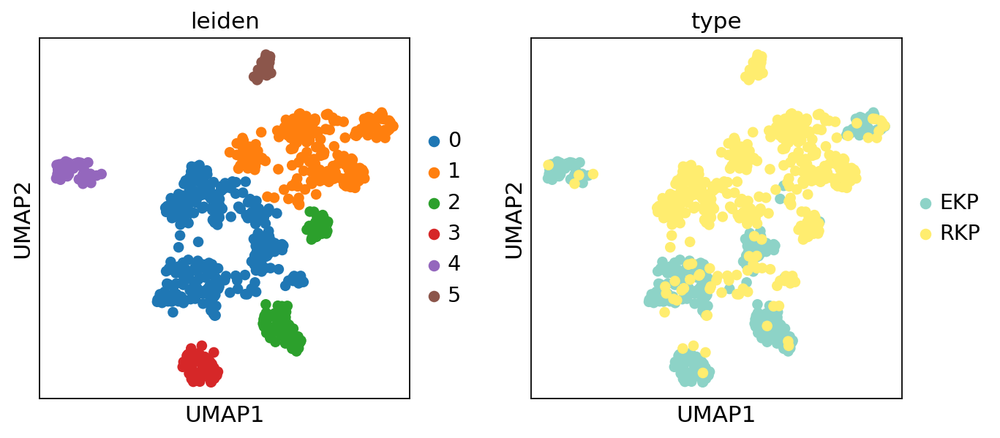

In [16]:
sc.pl.umap(processed, color=['leiden','type'])

In [17]:
processed.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt,n_counts,celltype
AAACGCTCAGCTATAC-1-0,1108,1106,1432.900269,0.767421,0.053557,allograft,EKP,0,0,Immune,49.807819,3.476014,0.000000,0.000000,0.000536,1432.900269,Cd8 T cell
AAAGAACCAACGTTAC-1-0,360,359,902.994568,5.155742,0.570960,allograft,EKP,2,0,Immune,23.860329,2.642356,0.000000,0.000000,0.005710,902.994568,Cd8 T cell
AAAGAACCAGATCACT-1-0,532,531,1164.364624,11.460076,0.984234,allograft,EKP,0,0,Immune,16.742529,1.437911,1.967717,0.168995,0.009842,1164.364624,Cd4 T cell
AAAGAACGTTCTAACG-1-0,429,429,1036.792358,13.925270,1.343111,allograft,EKP,1,0,Immune,21.592438,2.082619,0.000000,0.000000,0.013431,1036.792358,Cd8 T cell
AACAAGAGTATGAGCG-1-0,1016,1016,1562.875610,1.197922,0.076649,allograft,EKP,0,0,Immune,45.257126,2.895760,0.000000,0.000000,0.000766,1562.875610,Cd4 T cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGATGTA-1-1,2478,2466,2189.637451,31.620113,1.444080,allograft,RKP,0,1,Immune,197.913742,9.038653,0.000000,0.000000,0.014441,2189.637451,Cd4 T cell
TTTCACAAGGGAGGTG-1-1,3981,3968,2180.291992,27.960487,1.282419,allograft,RKP,1,1,Immune,250.257080,11.478146,1.002966,0.046001,0.012824,2180.291992,Cd8 T cell
TTTCACATCGTTCCTG-1-1,2290,2279,2299.202393,20.452291,0.889539,allograft,RKP,1,1,Immune,189.494675,8.241757,1.387164,0.060332,0.008895,2299.202393,Cd8 T cell
TTTCCTCGTTAAGAAC-1-1,2045,2034,2233.270264,35.784237,1.602324,allograft,RKP,1,1,Immune,22.240664,0.995879,3.076353,0.137751,0.016023,2233.270264,Cd8 T cell


In [18]:
raw.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch
AAACCCACAACACACT-1-0,1224,1224,5703.0,7.0,0.122742,allograft,EKP,0,0
AAACCCACAGACTCTA-1-0,1280,1279,4325.0,36.0,0.832370,allograft,EKP,1,0
AAACGAACACAACGTT-1-0,1853,1852,6411.0,125.0,1.949774,allograft,EKP,0,0
AAACGAACAGACGATG-1-0,1839,1839,4647.0,1.0,0.021519,allograft,EKP,4,0
AAACGAAGTTTGGGTT-1-0,1438,1438,3224.0,27.0,0.837469,allograft,EKP,3,0
...,...,...,...,...,...,...,...,...,...
TTTGACTAGATCGGTG-1-1,2571,2569,8336.0,176.0,2.111324,allograft,RKP,2,1
TTTGACTGTTGTGGAG-1-1,1243,1243,5308.0,152.0,2.863602,allograft,RKP,3,1
TTTGATCGTGCGTGCT-1-1,1629,1628,4435.0,31.0,0.698985,allograft,RKP,2,1
TTTGGAGTCTATCCAT-1-1,2961,2960,10369.0,86.0,0.829395,allograft,RKP,2,1


In [19]:
processed.obs['leiden']

AAACGCTCAGCTATAC-1-0    0
AAAGAACCAACGTTAC-1-0    2
AAAGAACCAGATCACT-1-0    0
AAAGAACGTTCTAACG-1-0    1
AACAAGAGTATGAGCG-1-0    0
                       ..
TTTATGCCAAGATGTA-1-1    0
TTTCACAAGGGAGGTG-1-1    1
TTTCACATCGTTCCTG-1-1    1
TTTCCTCGTTAAGAAC-1-1    1
TTTGTTGGTGAGTTTC-1-1    0
Name: leiden, Length: 699, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [20]:
raw.obs['leiden']= processed.obs['leiden']
raw.obs['type']= processed.obs['type']
raw.obs['celltype']= processed.obs['celltype']
data=raw[raw.obs['leiden'].isin(['0', '1', '2', '3', '4', '5'])]    # copy all the leiden clusters

In [21]:
data.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,celltype
AAACGCTCAGCTATAC-1-0,1108,1107,4319.0,1.0,0.023154,allograft,EKP,0,0,Cd8 T cell
AAAGAACCAACGTTAC-1-0,360,360,582.0,3.0,0.515464,allograft,EKP,2,0,Cd8 T cell
AAAGAACCAGATCACT-1-0,532,531,810.0,8.0,0.987654,allograft,EKP,0,0,Cd4 T cell
AAAGAACGTTCTAACG-1-0,429,429,611.0,7.0,1.145663,allograft,EKP,1,0,Cd8 T cell
AACAAGAGTATGAGCG-1-0,1016,1016,2155.0,1.0,0.046404,allograft,EKP,0,0,Cd4 T cell
...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGATGTA-1-1,2478,2476,8308.0,425.0,5.115551,allograft,RKP,0,1,Cd4 T cell
TTTCACAAGGGAGGTG-1-1,3981,3978,20177.0,688.0,3.409823,allograft,RKP,1,1,Cd8 T cell
TTTCACATCGTTCCTG-1-1,2290,2289,5745.0,96.0,1.671018,allograft,RKP,1,1,Cd8 T cell
TTTCCTCGTTAAGAAC-1-1,2045,2044,5205.0,439.0,8.434198,allograft,RKP,1,1,Cd8 T cell


In [22]:
data.uns['leiden_colors']=processed.uns['leiden_colors']    # keep same leiden color as adata_processed.h5ad
data.obsm['X_umap']=processed.obsm['X_umap']    # keep same UMAP as adata_processed.h5ad

In [23]:
adata_scvelo = scv.utils.merge(data, ldata)    # copy splicing information to data, use adata_scvelo for RNA velocity

In [24]:
adata_scvelo

AnnData object with n_obs × n_vars = 699 × 16482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

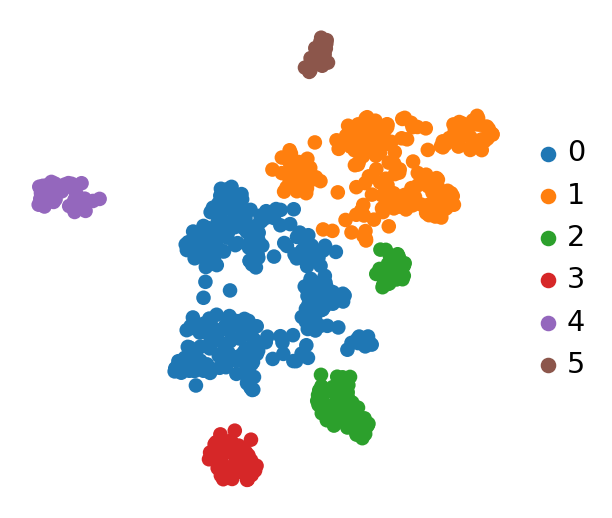

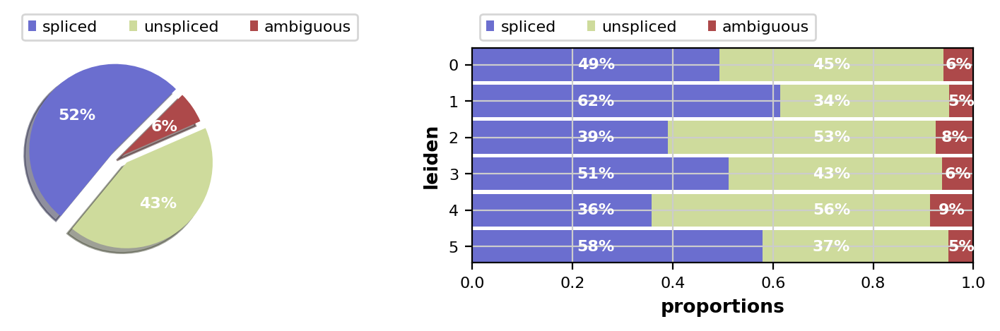

In [25]:
sc.pl.umap(adata_scvelo, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=False)    #check UMAP
scv.pl.proportions(adata_scvelo, groupby='leiden')    # check splicing informatin

In [26]:
adata_scvelo.write('Tcell_sliced_and_copied.h5ad')

In [156]:
adata = sc.read('Tcell_sliced_and_copied.h5ad')

In [157]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000, enforce=True)
scv.pp.log1p(adata)
adata

Filtered out 12177 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/tmp/ipykernel_7712/3888678615.py:2: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  scv.pp.log1p(adata)


AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'leiden_colors', 'log1p'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [158]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=10)
adata

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'leiden_colors', 'log1p', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


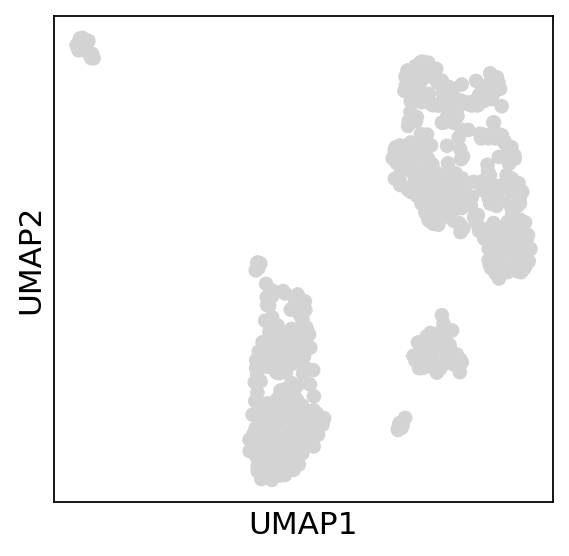

In [159]:
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.pl.umap(adata)

In [160]:
scv.tl.recover_dynamics(adata, n_jobs=16)
scv.tl.velocity(adata, mode='dynamical', use_raw=False)
scv.tl.velocity_graph(adata, n_jobs=16)
adata

recovering dynamics (using 16/16 cores)
    finished (0:00:28) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 16/16 cores)
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'leiden_colors', 'log1p', 'neighb

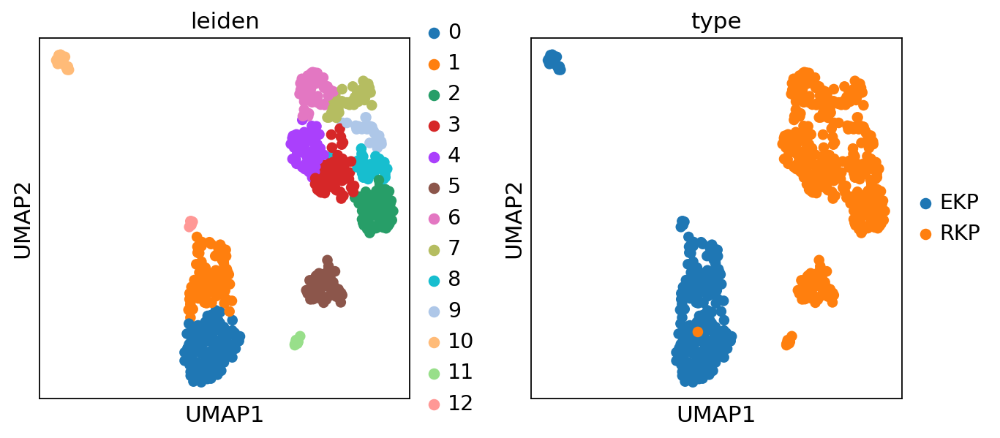

In [161]:
sc.pl.umap(adata, color=['leiden','type'])

In [162]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata, 'batch')
'X_pca_harmony' in adata.obsm
True

2025-01-21 04:22:20,481 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-01-21 04:22:20,619 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-01-21 04:22:20,622 - harmonypy - INFO - Iteration 1 of 10
2025-01-21 04:22:20,696 - harmonypy - INFO - Iteration 2 of 10
2025-01-21 04:22:20,768 - harmonypy - INFO - Iteration 3 of 10
2025-01-21 04:22:20,840 - harmonypy - INFO - Iteration 4 of 10
2025-01-21 04:22:20,909 - harmonypy - INFO - Iteration 5 of 10
2025-01-21 04:22:20,957 - harmonypy - INFO - Iteration 6 of 10
2025-01-21 04:22:21,027 - harmonypy - INFO - Iteration 7 of 10
2025-01-21 04:22:21,083 - harmonypy - INFO - Iteration 8 of 10
2025-01-21 04:22:21,118 - harmonypy - INFO - Converged after 8 iterations


True

In [163]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


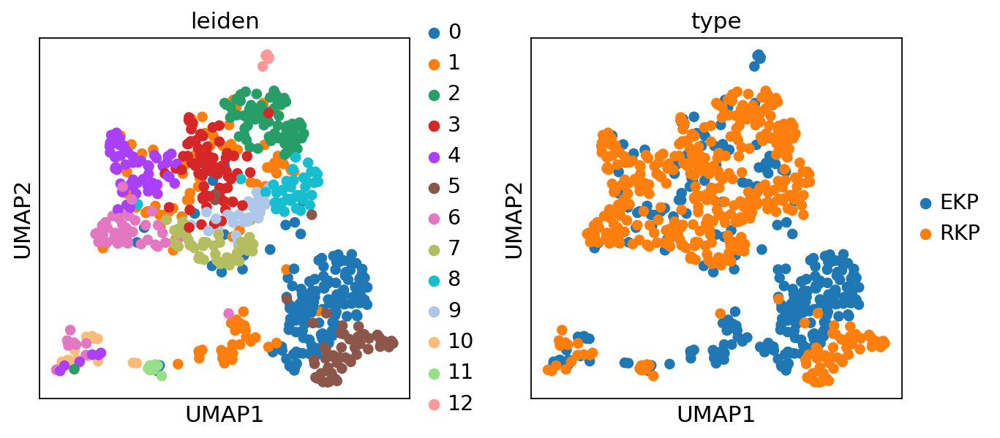

In [164]:
sc.pl.umap(adata, color=['leiden','type'])

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


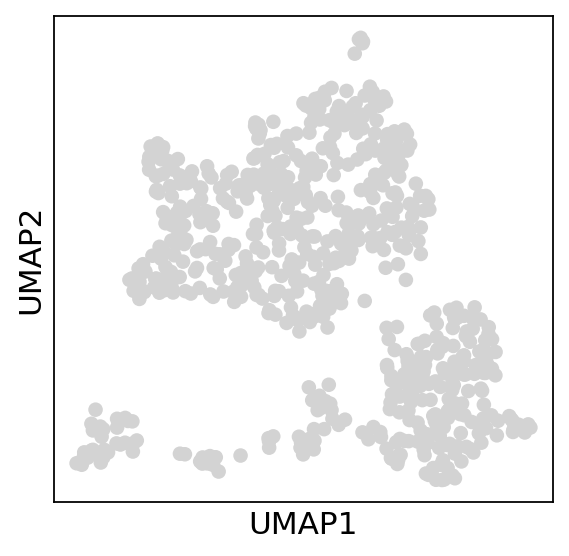

In [165]:
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata)

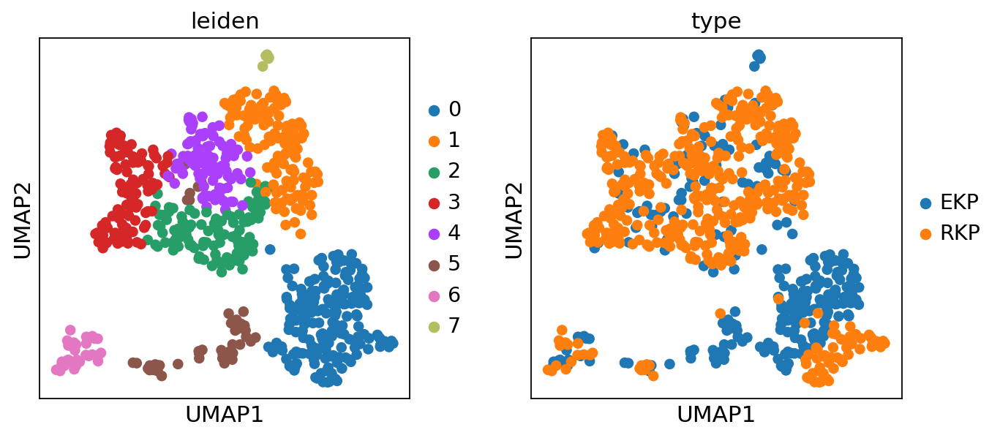

In [166]:
sc.pl.umap(adata, color=['leiden','type'])

In [167]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=15)
adata

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'leiden_colors', 'log1p', 'neighb

computing velocity graph (using 1/16 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


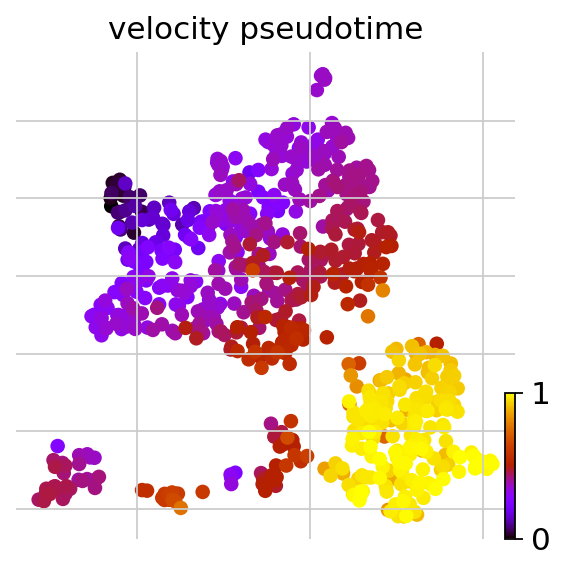

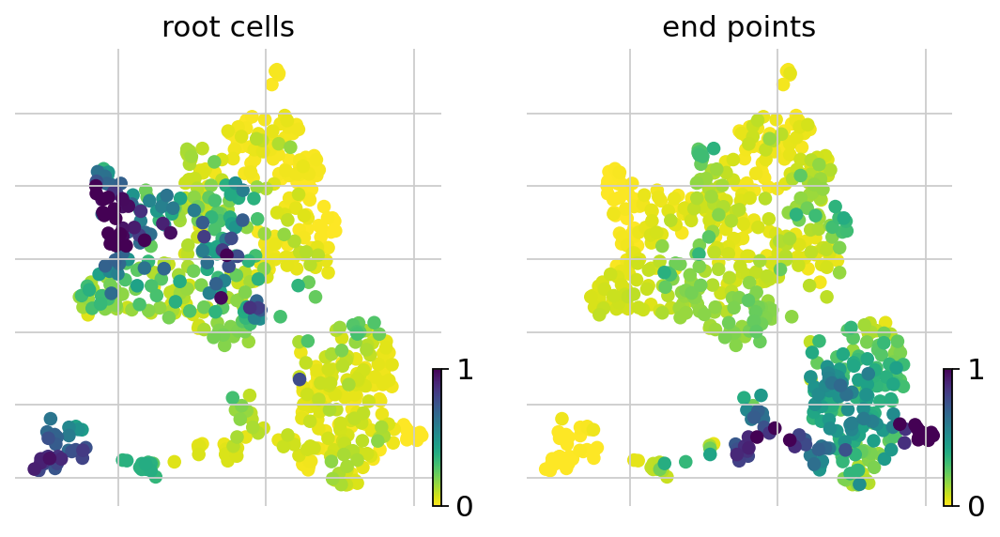

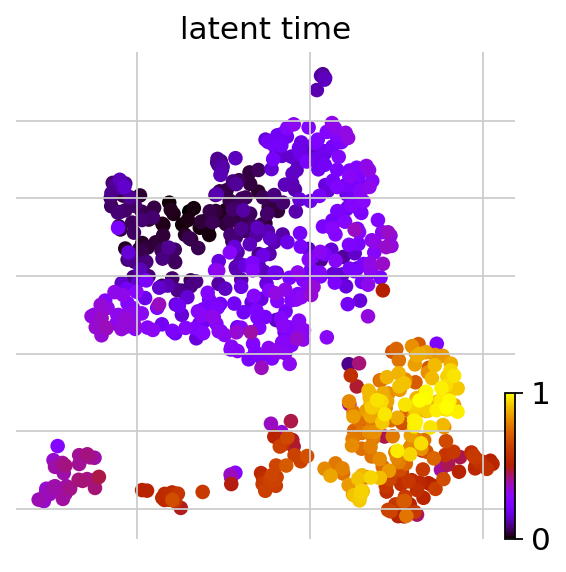

In [168]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=15, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


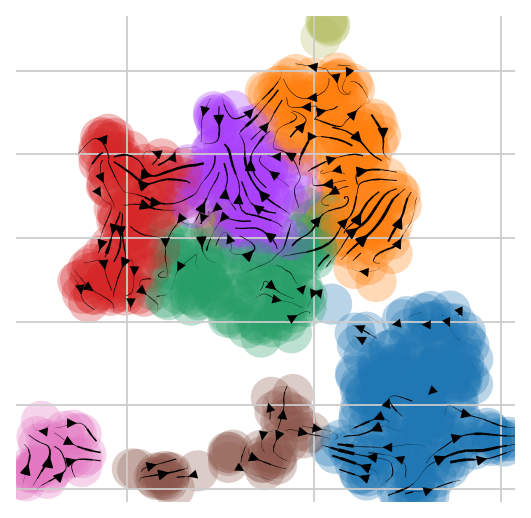

In [169]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_EKP_Tcell_stream.png


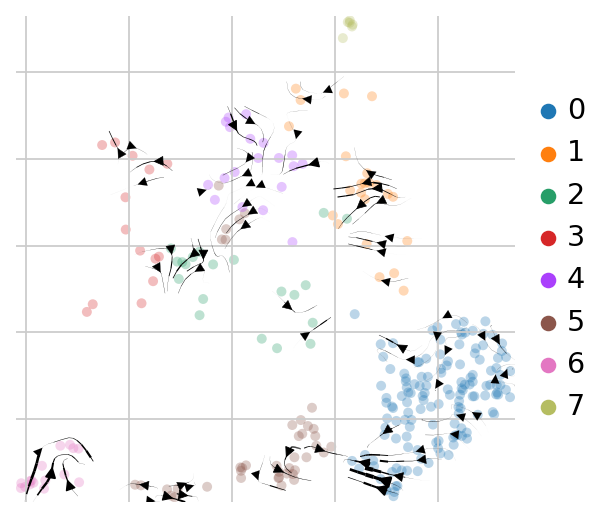

saving figure to file ./figures/scvelo_RKP_Tcell_stream.pdf


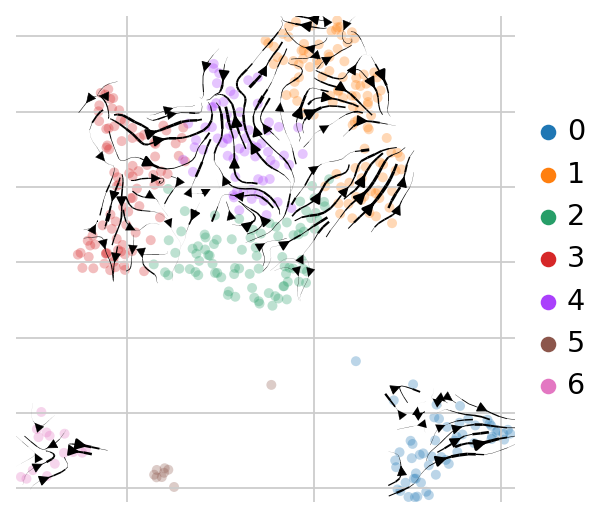

In [170]:
scv.pl.velocity_embedding_stream(adata[adata.obs['type']=='EKP'], basis='umap', color=['leiden'],size=80, legend_loc='right margin', title='', use_raw=False, frameon=False, save='EKP_Tcell_stream.pdf')
scv.pl.velocity_embedding_stream(adata[adata.obs['type']=='RKP'], basis='umap', color=['leiden'],size=80, legend_loc='right margin', title='', use_raw=False, frameon=False, save='RKP_Tcell_stream.pdf')

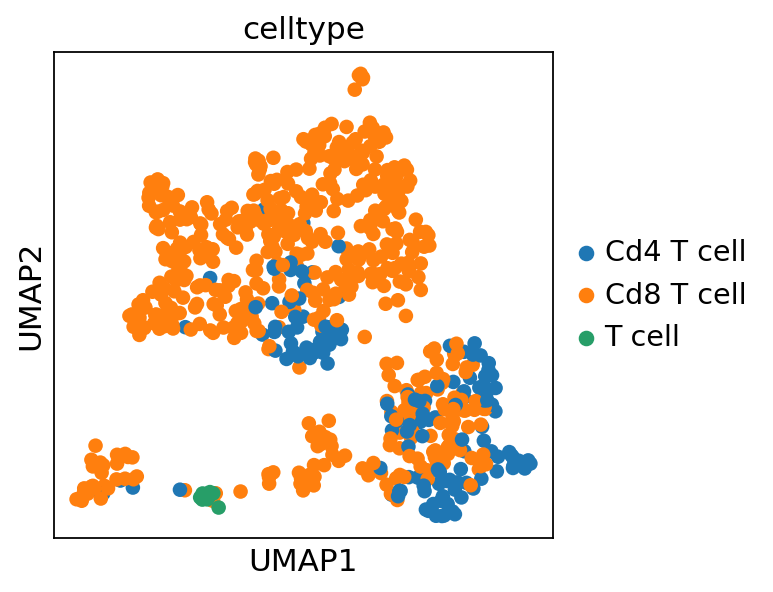

In [171]:
sc.pl.umap(adata, color=['celltype'],legend_loc='right margin')#, save='_Immune_Normal8_NAC15_Tumor15_by_leiden.pdf')

# overwrite scvelo info to processed file

In [71]:
processed

AnnData object with n_obs × n_vars = 699 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_rank_fgsea', 'neighbors', 'pca', 'tissue_1_colors', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [30]:
adata

AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_sca

In [95]:
# Remove the '-1-0' suffix from cell names in adata.obs
processed.obs.index = processed.obs.index.str.replace('-1-0$', '', regex=True)
processed.obs.index = processed.obs.index.str.replace('-1-1$', '', regex=True)
# Keep only the first 12 characters of cell names in adata.obs.index
processed.obs.index = processed.obs.index.str[:12]


In [96]:
processed.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt,n_counts,celltype,scvelo_leiden
AAACGCTCAGCT,1108,1106,1432.900269,0.767421,0.053557,allograft,EKP,NaN,0,Immune,49.807819,3.476014,0.000000,0.000000,0.000536,1432.900269,Cd8 T cell,NaN
AAAGAACCAACG,360,359,902.994568,5.155742,0.570960,allograft,EKP,NaN,0,Immune,23.860329,2.642356,0.000000,0.000000,0.005710,902.994568,Cd8 T cell,NaN
AAAGAACCAGAT,532,531,1164.364624,11.460076,0.984234,allograft,EKP,NaN,0,Immune,16.742529,1.437911,1.967717,0.168995,0.009842,1164.364624,Cd4 T cell,NaN
AAAGAACGTTCT,429,429,1036.792358,13.925270,1.343111,allograft,EKP,NaN,0,Immune,21.592438,2.082619,0.000000,0.000000,0.013431,1036.792358,Cd8 T cell,NaN
AACAAGAGTATG,1016,1016,1562.875610,1.197922,0.076649,allograft,EKP,NaN,0,Immune,45.257126,2.895760,0.000000,0.000000,0.000766,1562.875610,Cd4 T cell,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGA,2478,2466,2189.637451,31.620113,1.444080,allograft,RKP,NaN,1,Immune,197.913742,9.038653,0.000000,0.000000,0.014441,2189.637451,Cd4 T cell,NaN
TTTCACAAGGGA,3981,3968,2180.291992,27.960487,1.282419,allograft,RKP,NaN,1,Immune,250.257080,11.478146,1.002966,0.046001,0.012824,2180.291992,Cd8 T cell,NaN
TTTCACATCGTT,2290,2279,2299.202393,20.452291,0.889539,allograft,RKP,NaN,1,Immune,189.494675,8.241757,1.387164,0.060332,0.008895,2299.202393,Cd8 T cell,NaN
TTTCCTCGTTAA,2045,2034,2233.270264,35.784237,1.602324,allograft,RKP,NaN,1,Immune,22.240664,0.995879,3.076353,0.137751,0.016023,2233.270264,Cd8 T cell,NaN


In [97]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,celltype,sample_batch,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition,root_cells,end_points,velocity_pseudotime,latent_time
AAACGCTCAGCT,1108,1107,4319.0,1.0,0.023154,allograft,EKP,5,0,Cd8 T cell,ATAC-1-0,1853,1970,1970.0,1470.714722,0.480940,0.095506,0.461826,0.583155,0.453563
AAAGAACCAACG,360,360,582.0,3.0,0.515464,allograft,EKP,0,0,Cd8 T cell,TTAC-1-0,348,164,164.0,10844.889648,0.708414,0.017807,0.418654,0.972640,0.980217
AAAGAACCAGAT,532,531,810.0,8.0,0.987654,allograft,EKP,0,0,Cd4 T cell,CACT-1-0,415,277,277.0,7878.556152,0.726832,0.034979,0.396467,0.935419,0.709322
AAAGAACGTTCT,429,429,611.0,7.0,1.145663,allograft,EKP,3,0,Cd8 T cell,AACG-1-0,204,305,305.0,6220.828613,0.591974,0.482430,0.035146,0.140615,0.046374
AACAAGAGTATG,1016,1016,2155.0,1.0,0.046404,allograft,EKP,2,0,Cd4 T cell,AGCG-1-0,1576,1843,1843.0,1545.113403,0.865934,0.333998,0.099168,0.315962,0.067380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGA,2478,2476,8308.0,425.0,5.115551,allograft,RKP,2,1,Cd4 T cell,TGTA-1-1,2421,4040,4040.0,1015.268555,0.762205,0.155203,0.141195,0.340728,0.246261
TTTCACAAGGGA,3981,3978,20177.0,688.0,3.409823,allograft,RKP,3,1,Cd8 T cell,GGTG-1-1,3143,12287,12287.0,320.227600,0.286608,0.438414,0.006520,0.038004,0.151268
TTTCACATCGTT,2290,2289,5745.0,96.0,1.671018,allograft,RKP,2,1,Cd8 T cell,CCTG-1-1,1756,2877,2877.0,1472.411011,0.780253,0.564897,0.075316,0.402751,0.213353
TTTCCTCGTTAA,2045,2044,5205.0,439.0,8.434198,allograft,RKP,0,1,Cd8 T cell,GAAC-1-1,3330,862,862.0,4761.129883,0.490274,0.051735,0.193565,0.986373,0.518440


In [98]:
processed.obs['leiden'] = adata.obs['leiden']
#processed.obs['velocity_length'] = adata.obs['velocity_length']

processed.uns['umap'] = adata.uns['umap']

processed.obsm['velocity_umap'] = adata.obsm['velocity_umap']
processed.obsm['X_umap'] = adata.obsm['X_umap']

#processed.layers['velocity'] = adata.layers['velocity']


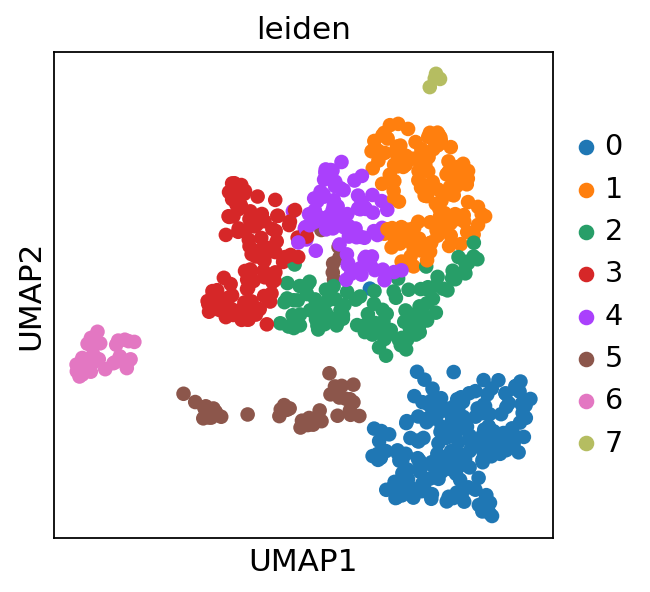

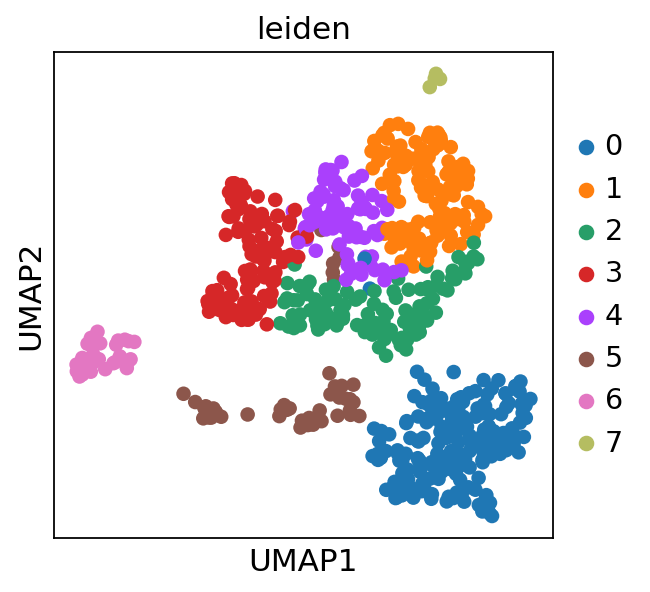

In [100]:
sc.pl.umap(adata, color=['leiden'])
sc.pl.umap(processed, color=['leiden'])

In [101]:
processed.obs['leiden']=adata.obs['leiden']
processed.obs['initial_size_unspliced']=adata.obs['initial_size_unspliced']
processed.obs['initial_size_spliced']=adata.obs['initial_size_spliced']
processed.obs['initial_size']=adata.obs['initial_size']
processed.obs['velocity_self_transition']=adata.obs['velocity_self_transition']
processed.obs['root_cells']=adata.obs['root_cells']
processed.obs['end_points']=adata.obs['end_points']
processed.obs['velocity_pseudotime']=adata.obs['velocity_pseudotime']
processed.obs['latent_time']=adata.obs['latent_time']

processed.uns['leiden_colors']=adata.uns['leiden_colors']
processed.uns['neighbors']=adata.uns['neighbors']
processed.uns['umap']=adata.uns['umap']
processed.uns['leiden']=adata.uns['leiden']
processed.uns['recover_dynamics']=adata.uns['recover_dynamics']
processed.uns['velocity_params']=adata.uns['velocity_params']
processed.uns['velocity_graph']=adata.uns['velocity_graph']
processed.uns['velocity_graph_neg']=adata.uns['velocity_graph_neg']
processed.uns['type_colors']=adata.uns['type_colors']
processed.uns['celltype_colors']=adata.uns['celltype_colors']

processed.obsm['X_umap']=adata.obsm['X_umap']
processed.obsm['velocity_umap']=adata.obsm['velocity_umap']
processed.obsm['X_pca']=adata.obsm['X_pca']
processed.obsm['X_pca_harmony']=adata.obsm['X_pca_harmony']



In [102]:
processed.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,tissue_1,...,celltype,scvelo_leiden,initial_size_unspliced,initial_size_spliced,initial_size,velocity_self_transition,root_cells,end_points,velocity_pseudotime,latent_time
AAACGCTCAGCT,1108,1106,1432.900269,0.767421,0.053557,allograft,EKP,5,0,Immune,...,Cd8 T cell,NaN,1853,1970,1970.0,0.480940,0.095506,0.461826,0.583155,0.453563
AAAGAACCAACG,360,359,902.994568,5.155742,0.570960,allograft,EKP,0,0,Immune,...,Cd8 T cell,NaN,348,164,164.0,0.708414,0.017807,0.418654,0.972640,0.980217
AAAGAACCAGAT,532,531,1164.364624,11.460076,0.984234,allograft,EKP,0,0,Immune,...,Cd4 T cell,NaN,415,277,277.0,0.726832,0.034979,0.396467,0.935419,0.709322
AAAGAACGTTCT,429,429,1036.792358,13.925270,1.343111,allograft,EKP,3,0,Immune,...,Cd8 T cell,NaN,204,305,305.0,0.591974,0.482430,0.035146,0.140615,0.046374
AACAAGAGTATG,1016,1016,1562.875610,1.197922,0.076649,allograft,EKP,2,0,Immune,...,Cd4 T cell,NaN,1576,1843,1843.0,0.865934,0.333998,0.099168,0.315962,0.067380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTATGCCAAGA,2478,2466,2189.637451,31.620113,1.444080,allograft,RKP,2,1,Immune,...,Cd4 T cell,NaN,2421,4040,4040.0,0.762205,0.155203,0.141195,0.340728,0.246261
TTTCACAAGGGA,3981,3968,2180.291992,27.960487,1.282419,allograft,RKP,3,1,Immune,...,Cd8 T cell,NaN,3143,12287,12287.0,0.286608,0.438414,0.006520,0.038004,0.151268
TTTCACATCGTT,2290,2279,2299.202393,20.452291,0.889539,allograft,RKP,2,1,Immune,...,Cd8 T cell,NaN,1756,2877,2877.0,0.780253,0.564897,0.075316,0.402751,0.213353
TTTCCTCGTTAA,2045,2034,2233.270264,35.784237,1.602324,allograft,RKP,0,1,Immune,...,Cd8 T cell,NaN,3330,862,862.0,0.490274,0.051735,0.193565,0.986373,0.518440


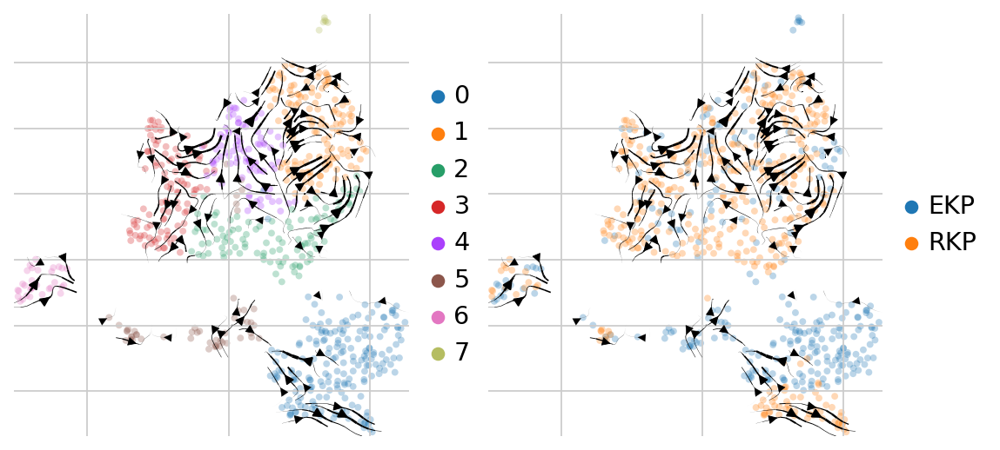

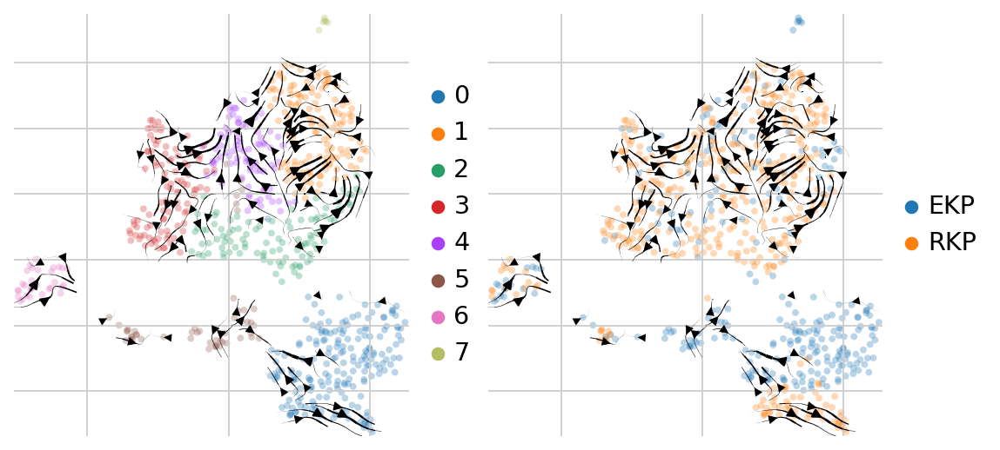

In [103]:
scv.pl.velocity_embedding_stream(processed, basis='umap', color=['leiden','type'],size=50, legend_loc='right margin', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden','type'],size=50, legend_loc='right margin', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

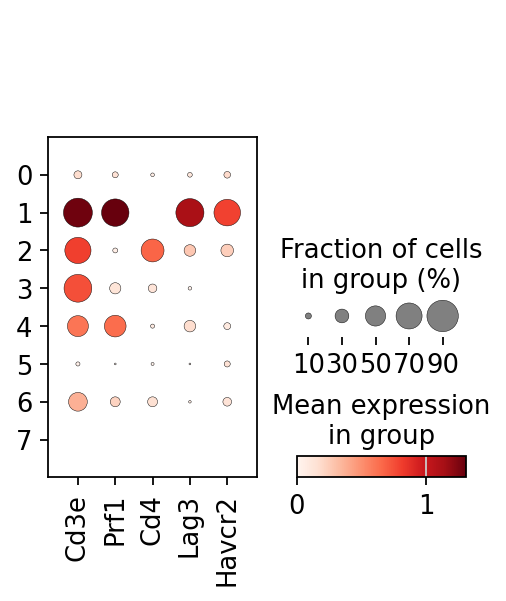

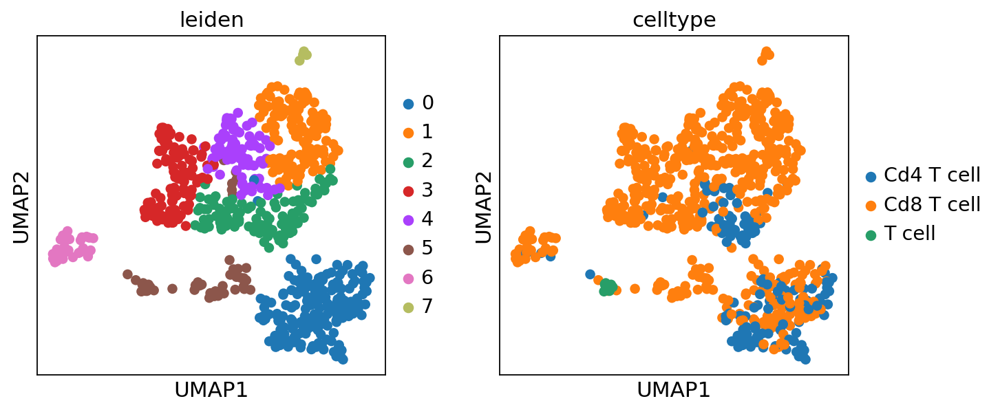

In [110]:
sc.pl.dotplot(processed, ['Cd3e','Prf1', 'Cd4','Lag3','Havcr2'], groupby='leiden')
sc.pl.umap(processed, color=['leiden','celltype'])

# T cell program (Nature Cancer 2024)

In [109]:
df = pd.crosstab(processed.obs['celltype'], processed.obs['type'])
df

type,EKP,RKP
celltype,,
Cd4 T cell,63,82
Cd8 T cell,215,331
T cell,0,8


#CD8 T cell state

In [111]:
#naive-like
nl_genes = ["Sell",	"Tcf7",	"Ablim1",	"Dgka",	"Gimap3",	"Slamf6",	"Gimap6",	"Kbtbd11",	"Add3",	"Sp100"]
#memory-like
ml_genes = ["Tcf7",	"Pnrc1",	"Ablim1",	"Nfkbia",	"Ccr7",	"Zfp36I1",	"Gimap6",	"Btg1",	"Emb",	"Slamf6"]
#activation
act_genes = ["Klrd1",	"Klrk1",	"Lag3",	"Nrp1",	"Ubash3b",	"Fam162a",	"Dusp2",	"Sh2d2a",	"Sdf4",	"II2rb"]
#effector-ifn
eff_genes = ["Nr4a3",	"Nr4a2",	"NFkbid",	"Nr4a1",	"Zfp36I1",	"Myc",	"Rel",	"Slamf7",	"Cd69",	"Tnfsf14"]
#early-eff
eeff_genes = ["Tnfrsf9",	"Irf8",	"Zbtb32",	"II2ra",	"Hivep3",	"Sh2d2a",	"Snhg6",	"Serpinb9",	"NFkb1",	"Atf4"]
#cytotoxic-eff
ceff_genes = ["Prf1",	"II2rb",	"Id2",	"Tnfrsf9",	"Irf8",	"Sdf4",	"Serpinb9",	"Havcr2",	"Sh2d2a",	"Stat3"]
#dysfunctional
dys_genes = ["Cxcr6",	"Pdcd1",	"Klrd1",	"II2rb",	"Sh2d2a",	"Serpina3g",	"Tigit",	"Pnrc1",	"Id2",	"Btg1"]



In [113]:
sc.tl.score_genes(processed, nl_genes, score_name='nl_genes_score')
sc.tl.score_genes(processed, ml_genes, score_name='ml_genes_score')
sc.tl.score_genes(processed, act_genes, score_name='act_genes_score')
sc.tl.score_genes(processed, eff_genes, score_name='eff_genes_score')
sc.tl.score_genes(processed, eeff_genes, score_name='eeff_genes_score')
sc.tl.score_genes(processed, ceff_genes, score_name='ceff_genes_score')
sc.tl.score_genes(processed, dys_genes, score_name='dys_genes_score')

computing score 'nl_genes_score'
    finished: added
    'nl_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'ml_genes_score'
    finished: added
    'ml_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'act_genes_score'
    finished: added
    'act_genes_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'eff_genes_score'
    finished: added
    'eff_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'eeff_genes_score'
    finished: added
    'eeff_genes_score', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)
computing score 'ceff_genes_score'
    finished: added
    'ceff_genes_score', score of gene set (adata.obs).
    249 total control genes are used. (0:00:00)
computing score 'dys_genes_score'
    finished: added
    'dys_g

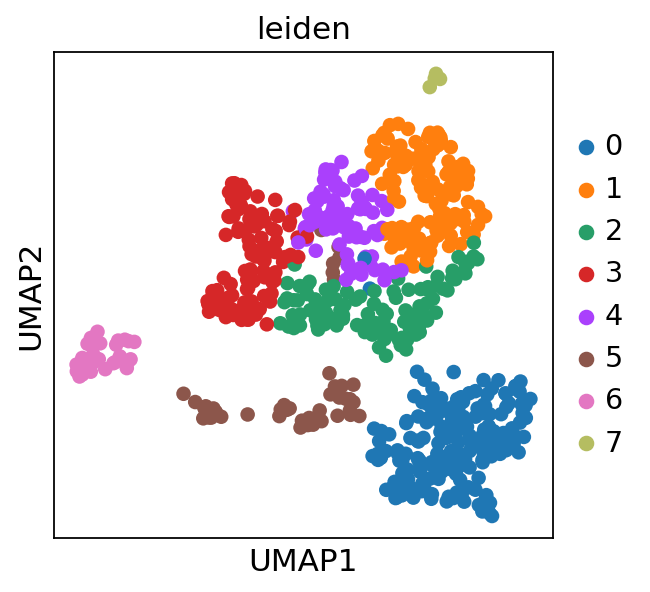

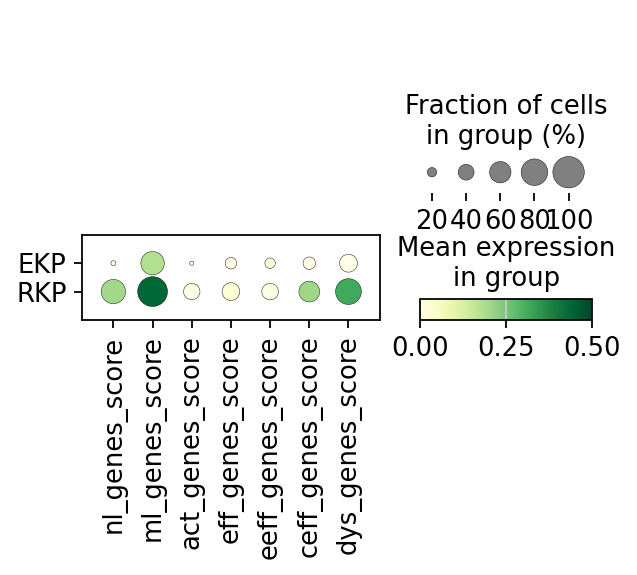

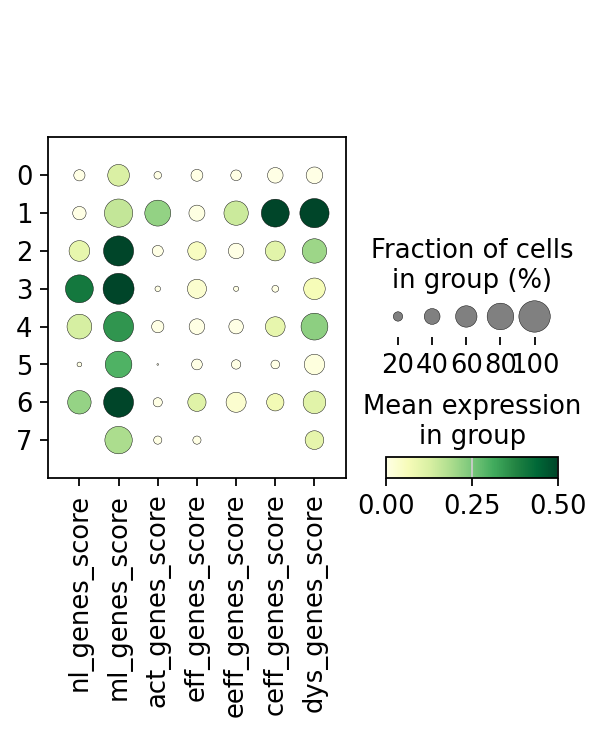

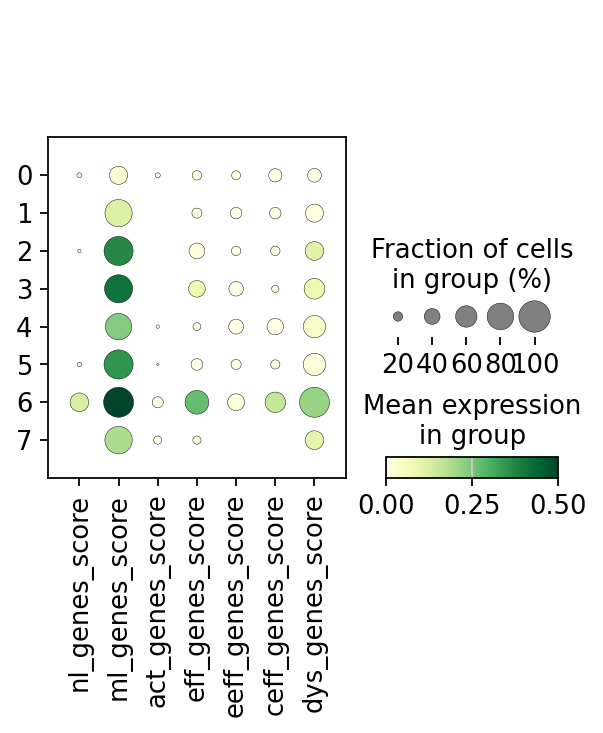

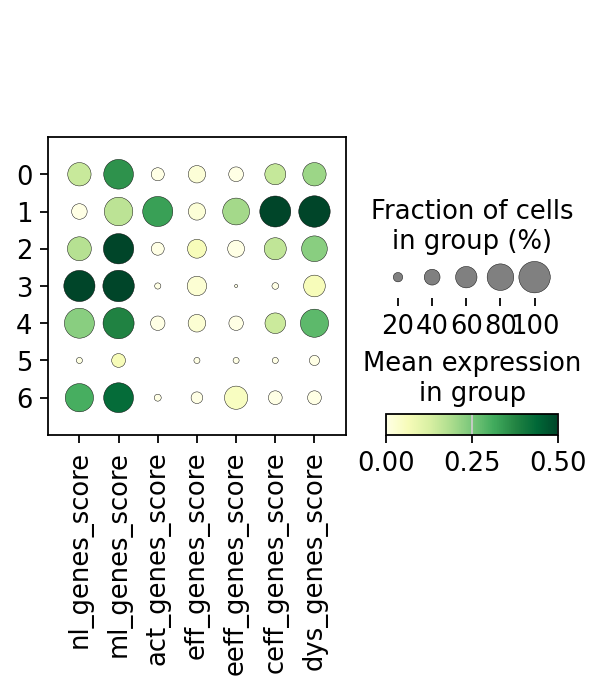

In [121]:
sc.pl.umap(processed, color=['leiden'])
sc.pl.dotplot(processed, ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='type',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(processed, ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(processed[processed.obs['type']=='EKP'], ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(processed[processed.obs['type']=='RKP'], ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')

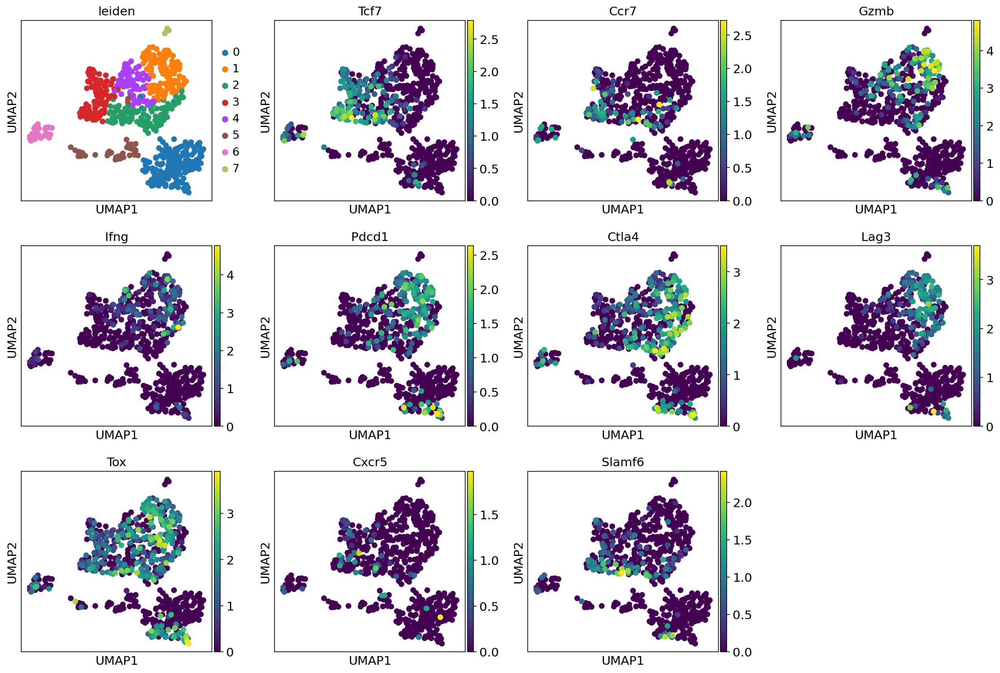

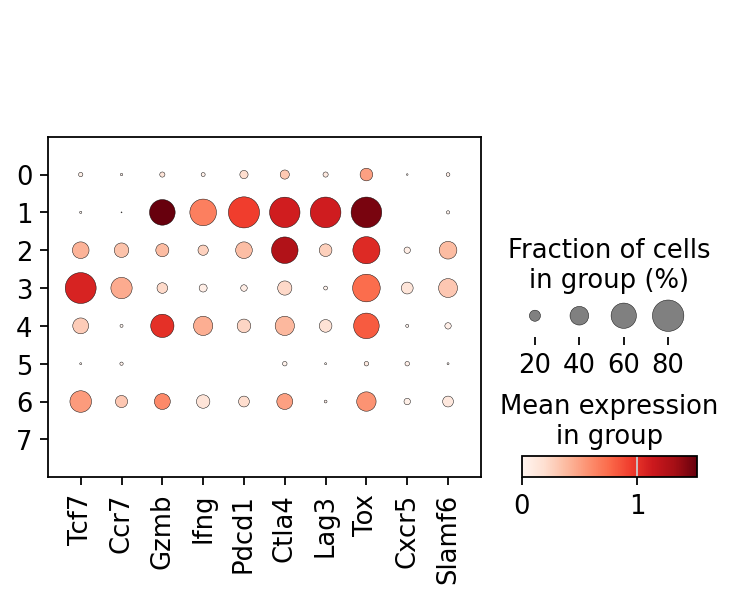

In [28]:
# naive-like Ccr7, Tcf7
# effector memory: Tcf7 and Gzmk high, Pdcd1 low
# early active: between naive-like and effector memory
# Tex: Pdcd1, Ctla4, Lag3, Tigit, Tim3, Tox
# CD4+ follicular-helper: Cxcl5, Slamf6
# Treg: Foxp3
sc.pl.umap(processed, color=['leiden','Tcf7','Ccr7','Gzmb','Ifng','Pdcd1','Ctla4','Lag3','Tox','Cxcr5','Slamf6'])
sc.pl.dotplot(processed, ['Tcf7','Ccr7','Gzmb','Ifng','Pdcd1','Ctla4','Lag3','Tox','Cxcr5','Slamf6'], groupby='leiden')

In [32]:
CD8T = processed[processed.obs['celltype']=='Cd8 T cell']
CD8T

View of AnnData object with n_obs × n_vars = 546 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype', 'scvelo_leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'nl_genes_score', 'ml_genes_score', 'act_genes_score', 'eff_genes_score', 'eeff_genes_score', 'ceff_genes_score', 'dys_genes_score'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
 

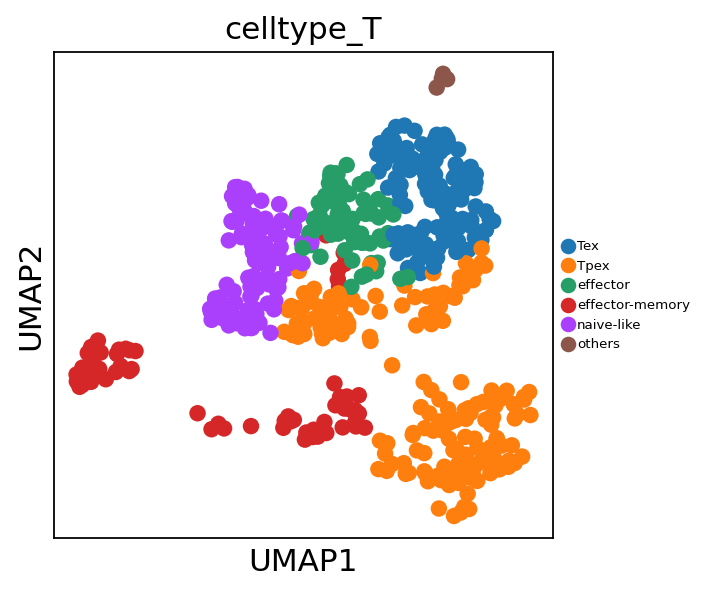

In [36]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'naive-like':      ['3'],
             'effector-memory': ['5','6'],
             'effector': ['4'],
             'Tpex': ['2','0'],
             'Tex':    ['1'],
             'others':  ['7']
              }

# Initialize empty column in cell metadata
CD8T.obs['cellstate'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(CD8T.obs.leiden).isin(cell_dict[i])
    CD8T.obs.loc[ind,'celltype_T'] = i

sc.pl.umap(CD8T, color=['celltype_T'], legend_loc='right margin', legend_fontsize=6, save='_Tcells_by_Tcelltypes.pdf')


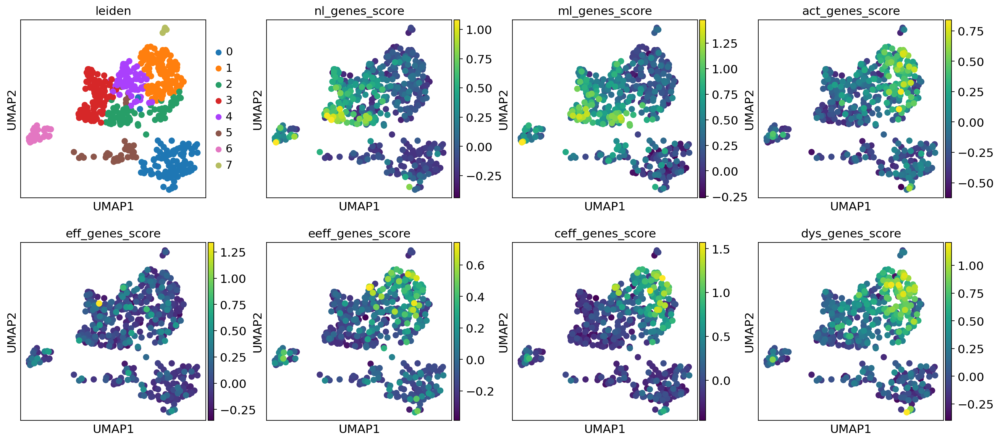

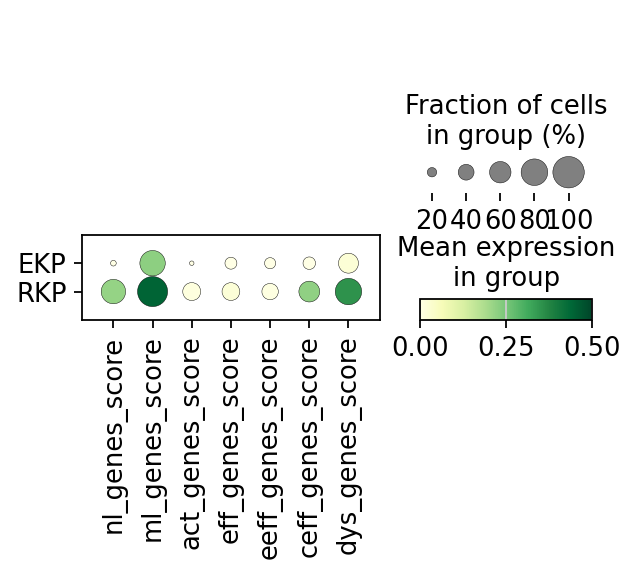

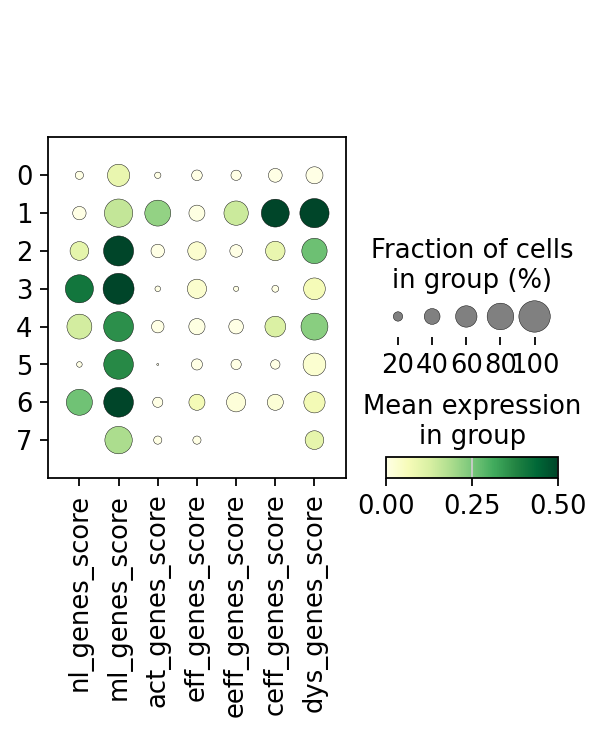

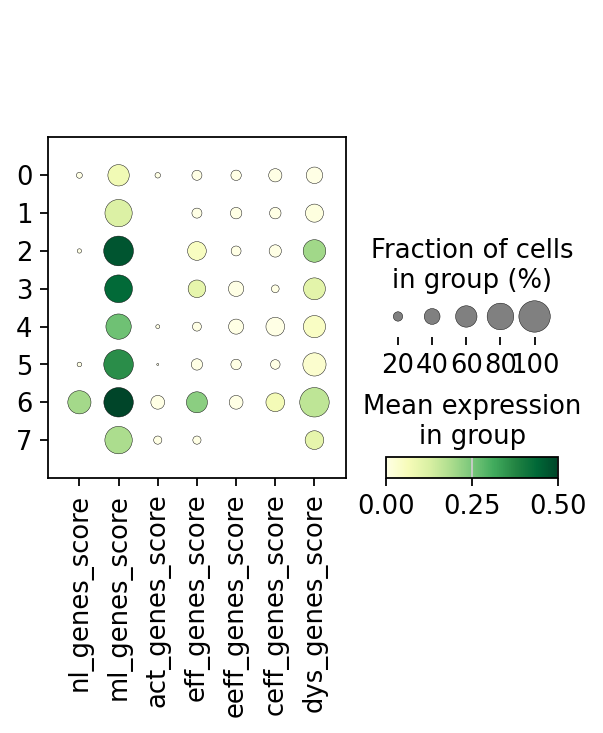

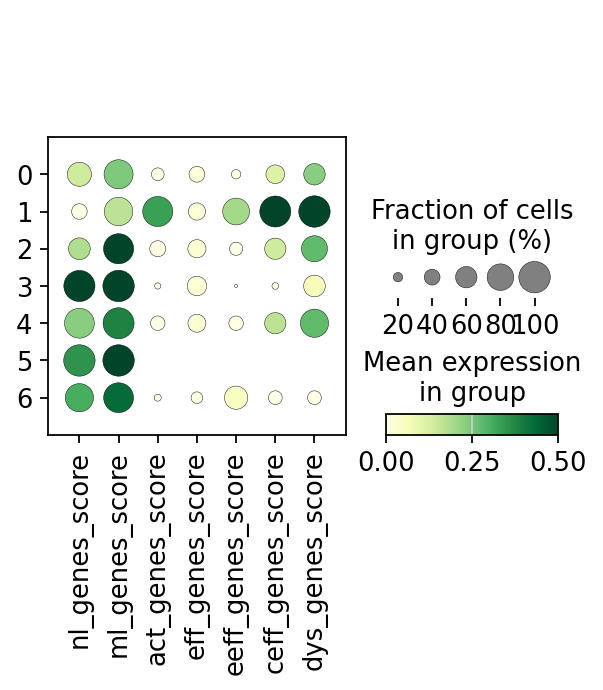

In [132]:
sc.pl.umap(CD8T, color=['leiden','nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],save='_CD8T_Tcell_state_new.pdf')
sc.pl.dotplot(CD8T, ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='type',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(CD8T, ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(CD8T[CD8T.obs['type']=='EKP'], ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')
sc.pl.dotplot(CD8T[CD8T.obs['type']=='RKP'], ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],cmap='YlGn', groupby='leiden',vmin=0, vmax=0.5)#, save='_STAT3_score_in_T_cells_by_type_v2.pdf')

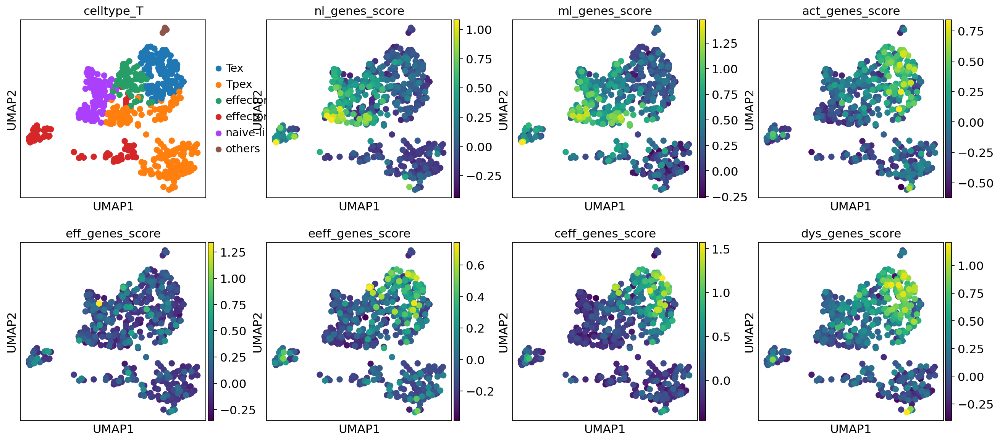

In [37]:
sc.pl.umap(CD8T, color=['celltype_T','nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'],save='_CD8T_Tcell_Tcelltype_new.pdf')

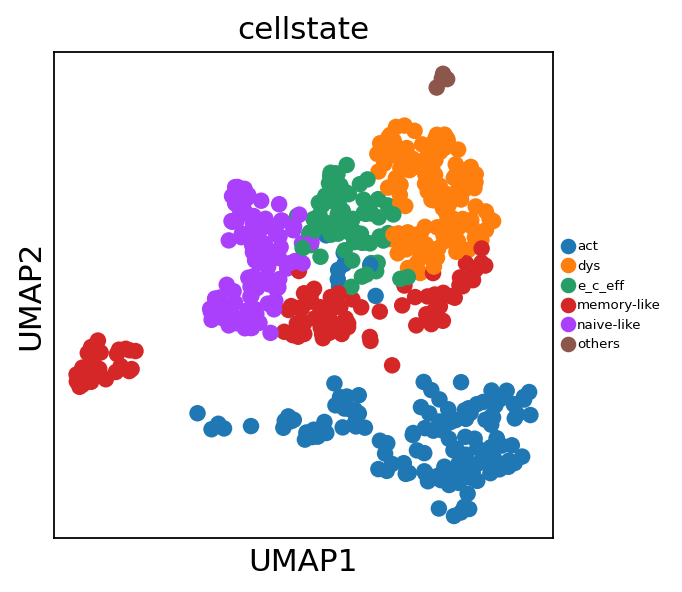

In [8]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'naive-like':      ['3'],
             'memory-like': ['2','6'],
             'act': ['5','0'],
             'e_c_eff': ['4'],
             'dys':    ['1'],
             'others':  ['7']
              }

# Initialize empty column in cell metadata
CD8T.obs['cellstate'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(CD8T.obs.leiden).isin(cell_dict[i])
    CD8T.obs.loc[ind,'cellstate'] = i

sc.pl.umap(CD8T, color=['cellstate'], legend_loc='right margin', legend_fontsize=6, save='_CD8T_cells_by_cellstate.pdf')


In [136]:
import pandas as pd

# Define the desired order of categories
desired_order = ['naive-like','act', 'e_c_eff', 'dys', 'memory-like','others']

# Reorder the categories
CD8T.obs['cellstate'] = pd.Categorical(
    CD8T.obs['cellstate'],
    categories=desired_order,
    ordered=True
)

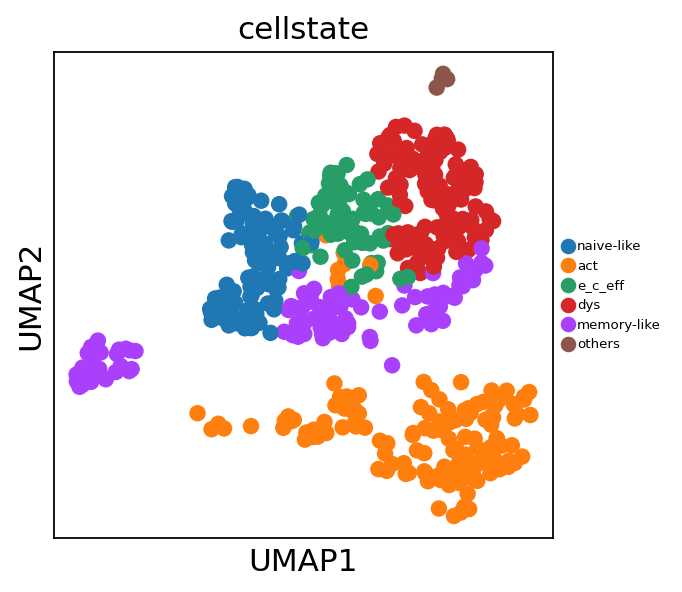

In [137]:
sc.pl.umap(CD8T, color=['cellstate'], legend_loc='right margin', legend_fontsize=6)#, save='_Immune_cells_by_celltype.pdf')

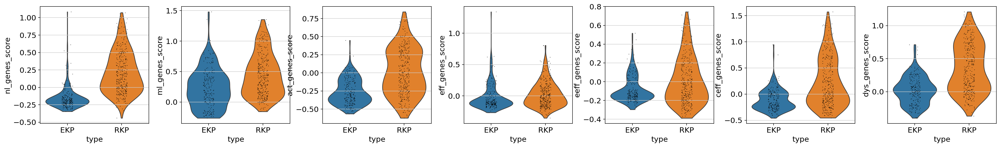

saving figure to file ./figures/scvelo__EKP_CD8T_cellstate_type.png


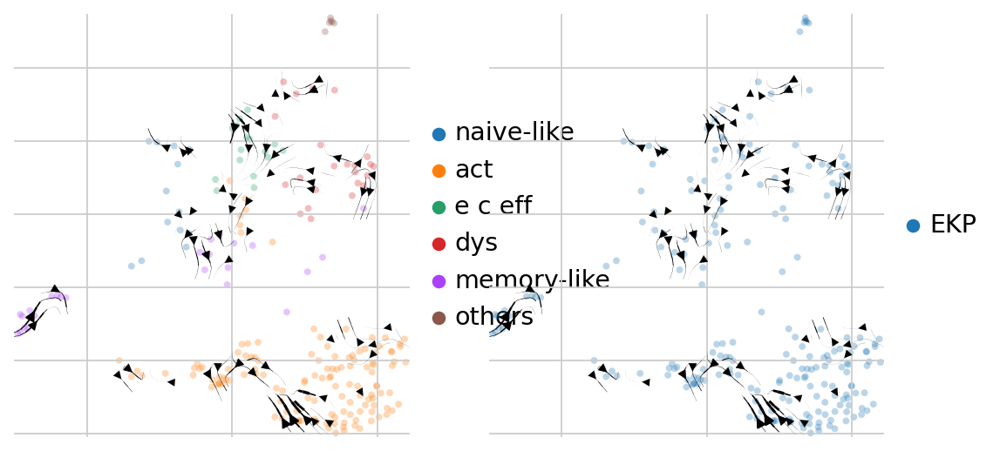

saving figure to file ./figures/scvelo__RKP_CD8T_cellstate_type.png


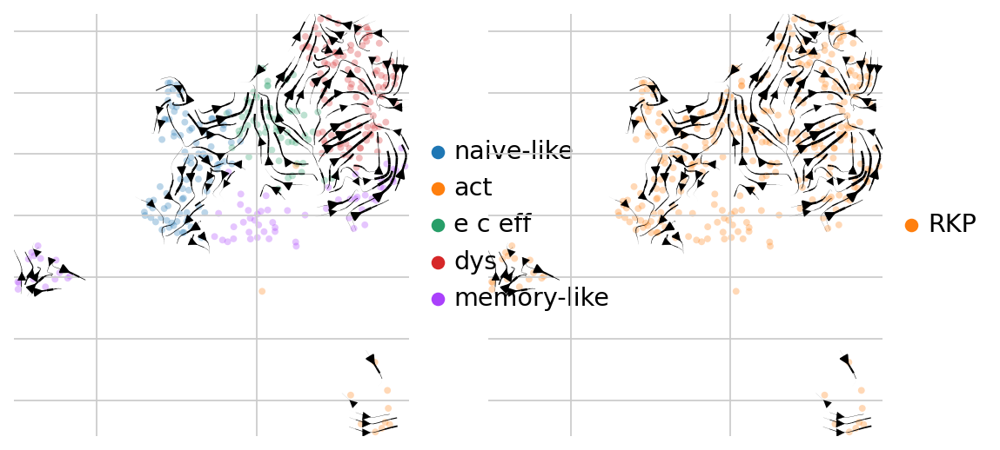

In [194]:
sc.pl.violin(CD8T, ['nl_genes_score','ml_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'], groupby='type')
scv.pl.velocity_embedding_stream(CD8T[CD8T.obs['type']=='EKP'], basis='umap', color=['cellstate','type'],size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_EKP_CD8T_cellstate_type.png')
scv.pl.velocity_embedding_stream(CD8T[CD8T.obs['type']=='RKP'], basis='umap', color=['cellstate','type'],size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_RKP_CD8T_cellstate_type.png')

In [39]:
# Define the desired order of categories
desired_order = ['naive-like','effector-memory', 'effector', 'Tpex', 'Tex','others']

# Reorder the categories
CD8T.obs['celltype_T'] = pd.Categorical(
    CD8T.obs['celltype_T'],
    categories=desired_order,
    ordered=True
)

In [40]:
scv.set_figure_params(style='scvelo', dpi=80, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__CD8T_celltype_T.png


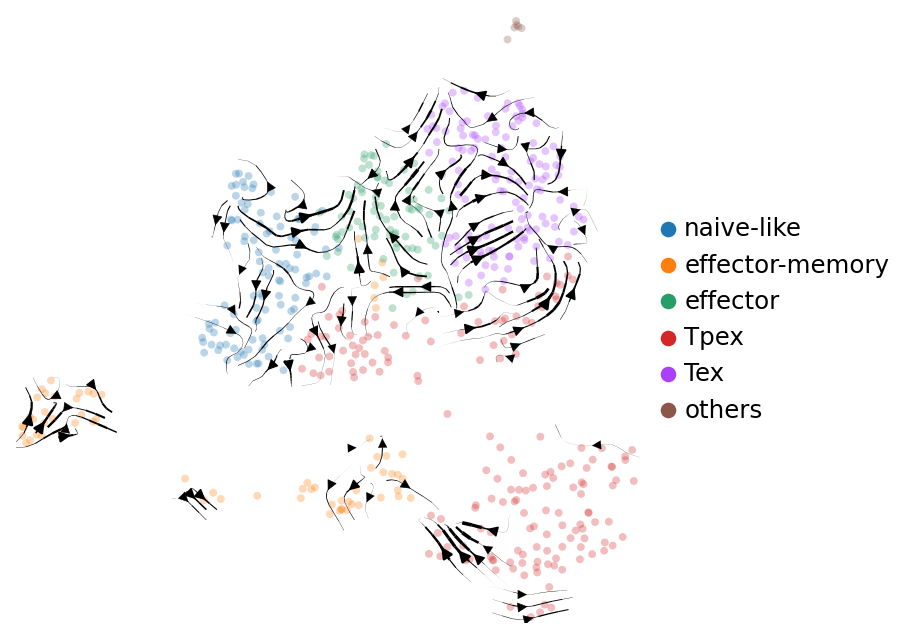

saving figure to file ./figures/scvelo__CD8T_type.png


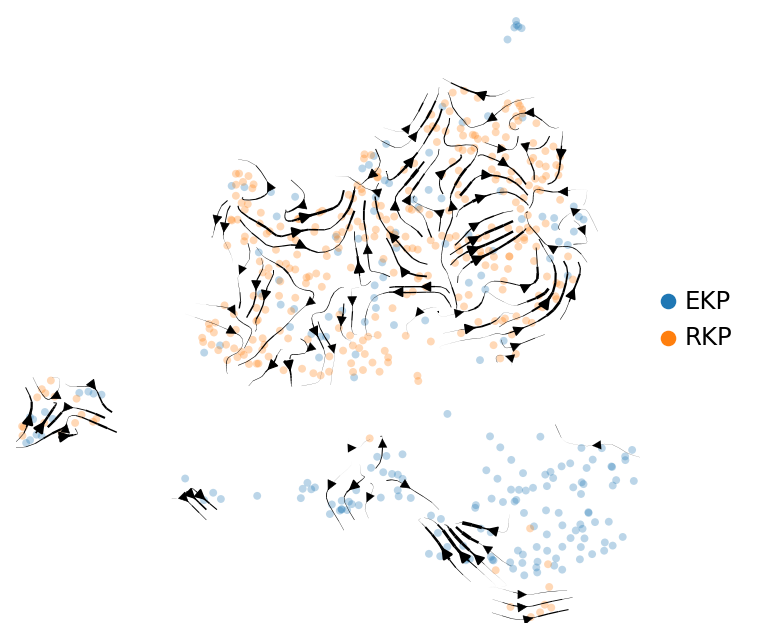

In [41]:
scv.pl.velocity_embedding_stream(CD8T, basis='umap', color=['celltype_T'], figsize= (5,5),size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_CD8T_celltype_T.png')
scv.pl.velocity_embedding_stream(CD8T, basis='umap', color=['type'], figsize= (5,5),size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_CD8T_type.png')

saving figure to file ./figures/scvelo__CD8T_EKP_celltype_T.png


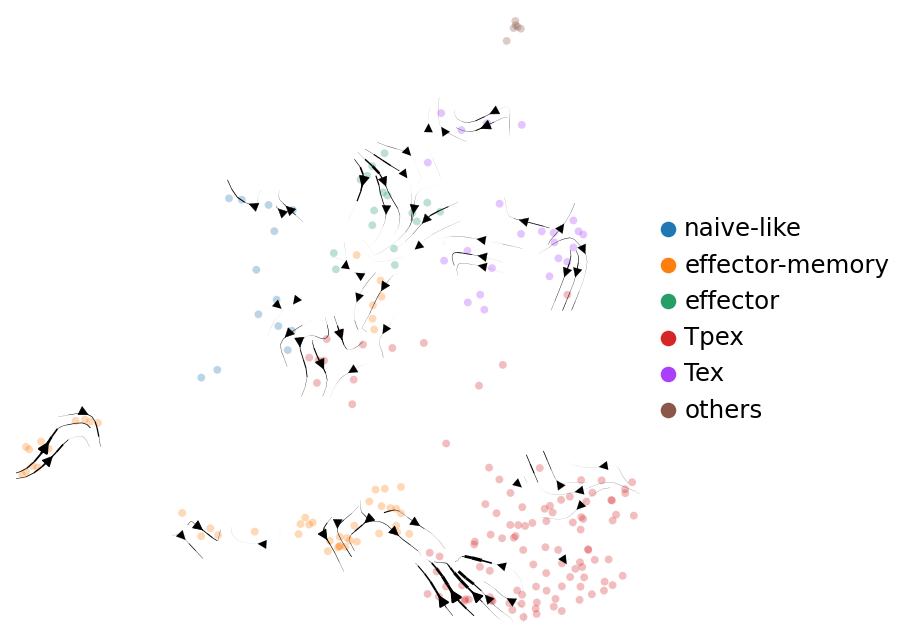

saving figure to file ./figures/scvelo__CD8T_RKP_celltype_T.png


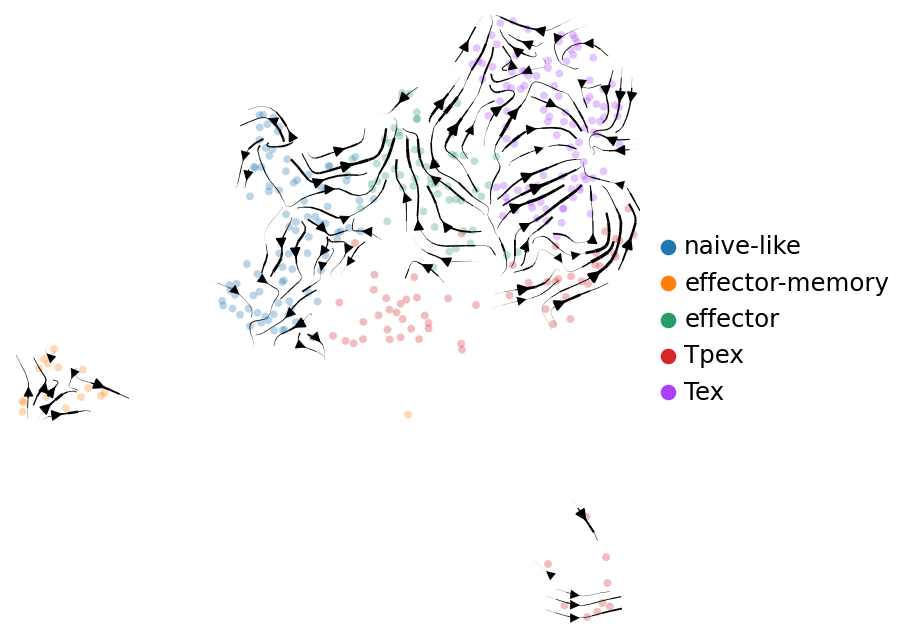

In [42]:
scv.pl.velocity_embedding_stream(CD8T[CD8T.obs['type']=='EKP'], basis='umap', color=['celltype_T'], figsize= (5,5),size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_CD8T_EKP_celltype_T.png')
scv.pl.velocity_embedding_stream(CD8T[CD8T.obs['type']=='RKP'], basis='umap', color=['celltype_T'], figsize= (5,5),size=50, legend_loc='right margin', title='', use_raw=False, frameon=False, save='_CD8T_RKP_celltype_T.png')

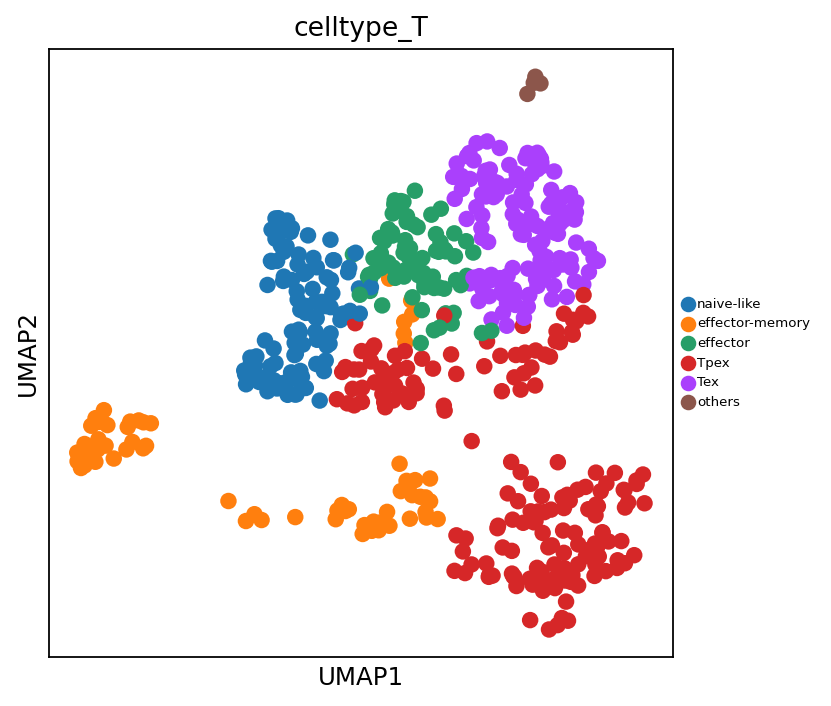

In [56]:
sc.pl.umap(CD8T, color=['celltype_T'], legend_loc='right margin', legend_fontsize=6, save='_CD8T_by_celltype_T.pdf')

In [59]:
CD8T

AnnData object with n_obs × n_vars = 546 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype', 'scvelo_leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'nl_genes_score', 'ml_genes_score', 'act_genes_score', 'eff_genes_score', 'eeff_genes_score', 'ceff_genes_score', 'dys_genes_score', 'cellstate', 'celltype_T'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_count

In [57]:
sub_CD8T = CD8T[CD8T.obs['celltype_T'].isin(['naive-like','effector-memory','effector','Tpex','Tex'])]
sub_CD8T

View of AnnData object with n_obs × n_vars = 540 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype', 'scvelo_leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'nl_genes_score', 'ml_genes_score', 'act_genes_score', 'eff_genes_score', 'eeff_genes_score', 'ceff_genes_score', 'dys_genes_score', 'cellstate', 'celltype_T'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'tot

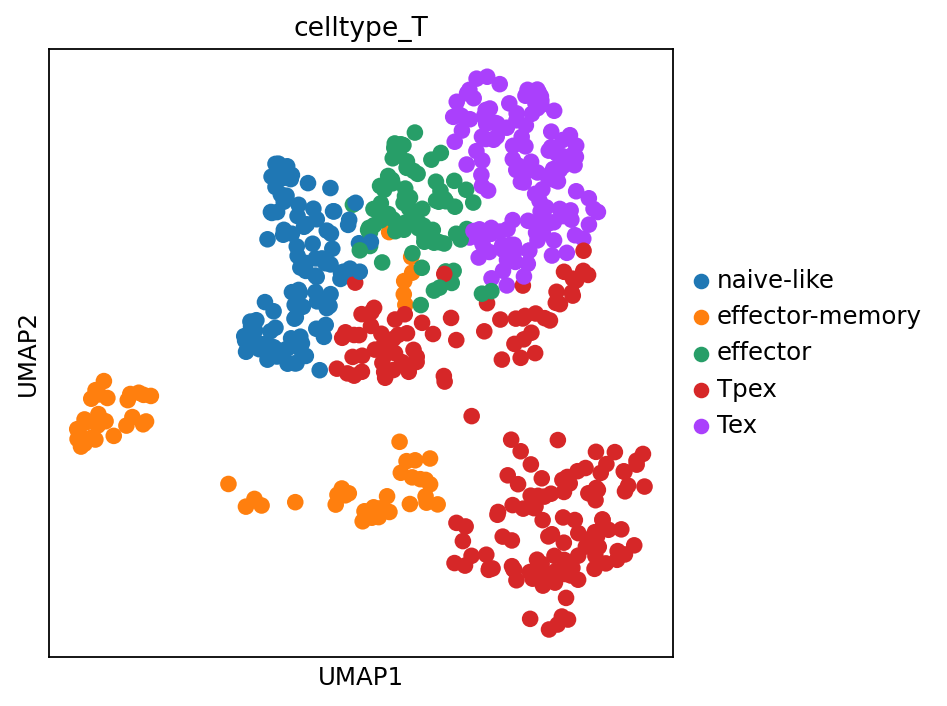

In [60]:
sc.pl.umap(sub_CD8T, color=['celltype_T'])

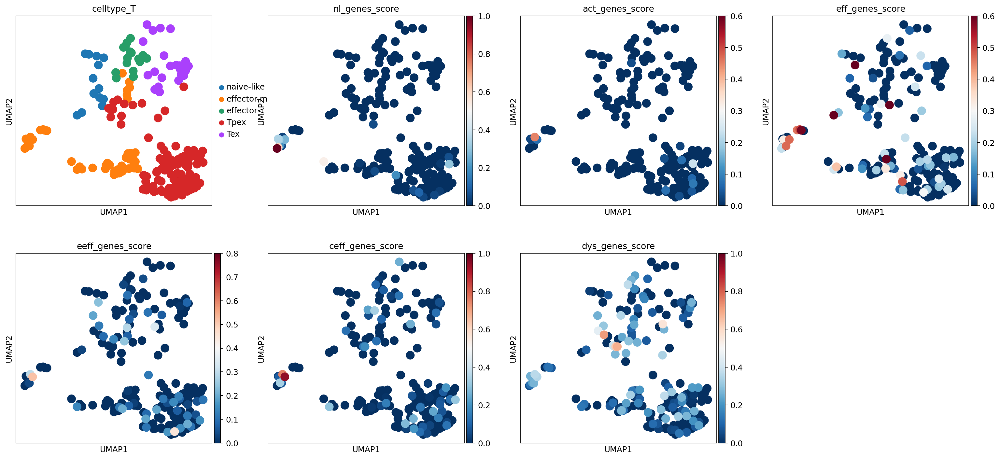

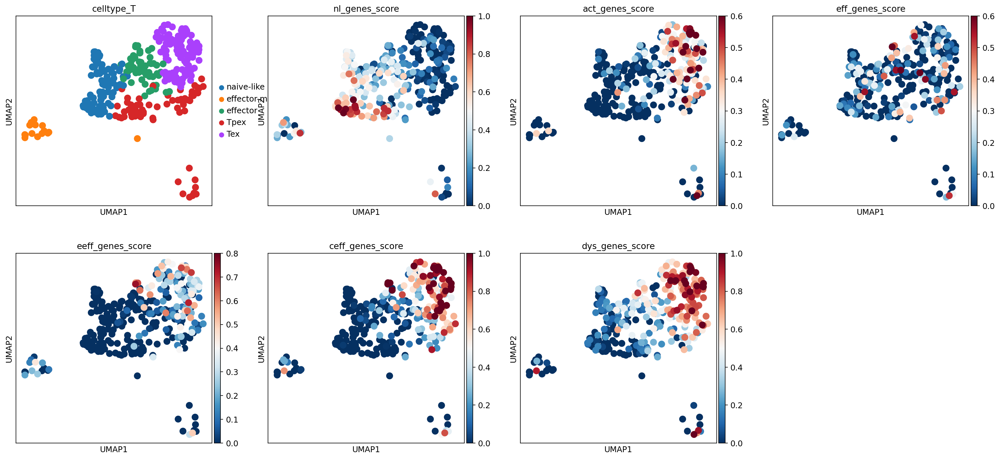

In [61]:
sc.pl.umap(sub_CD8T[sub_CD8T.obs['type']=='EKP'], color=['celltype_T','nl_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'], vmin=(0,0,0,0,0,0,0), vmax=(1,1,0.6,0.6,0.8,1,1),save='_CD8T_EKP_Tcell_state_new.pdf')
sc.pl.umap(sub_CD8T[sub_CD8T.obs['type']=='RKP'], color=['celltype_T','nl_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'], vmin=(0,0,0,0,0,0,0), vmax=(1,1,0.6,0.6,0.8,1,1),save='_CD8T_RKP_Tcell_state_new.pdf')

In [62]:
from matplotlib import rcParams

FIGSIZE = (5, 5)
rcParams["figure.figsize"] = FIGSIZE

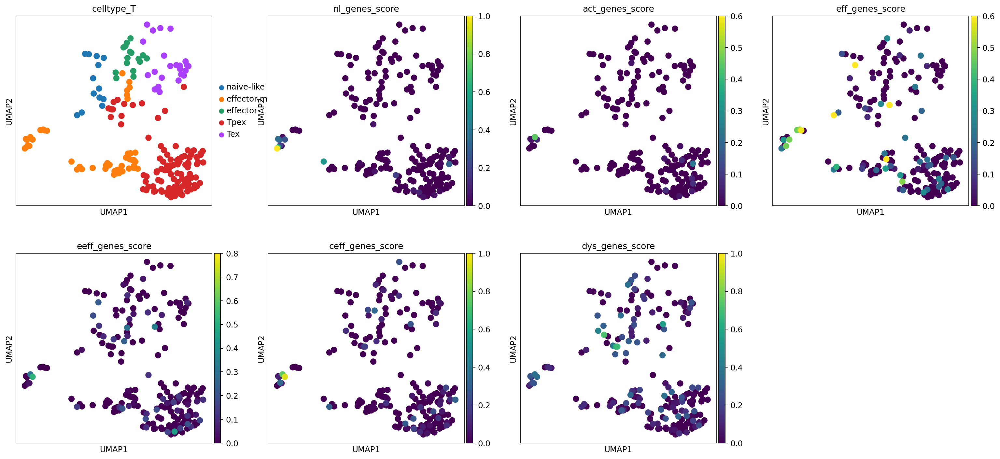

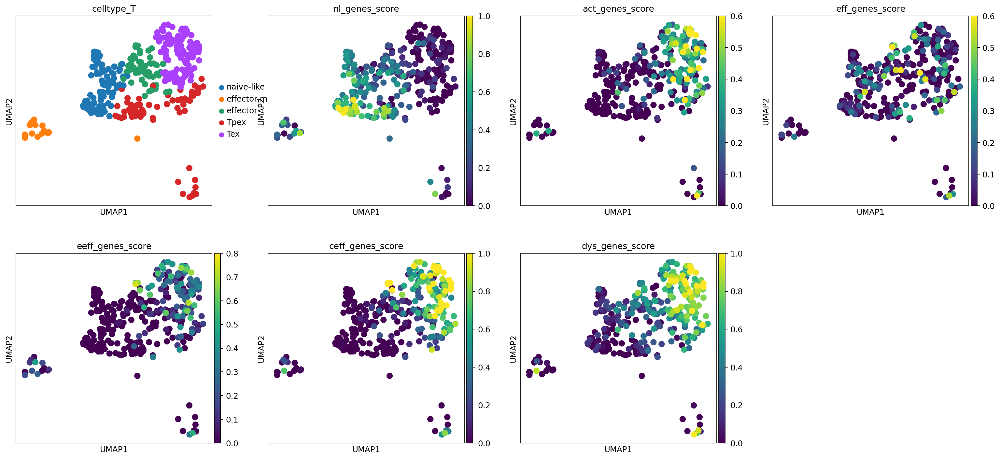

In [69]:
sc.pl.umap(sub_CD8T[sub_CD8T.obs['type']=='EKP'], color=['celltype_T','nl_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'], vmin=(0,0,0,0,0,0,0), vmax=(1,1,0.6,0.6,0.8,1,1), size=300, cmap='viridis',save='_CD8T_EKP_CD8Tcell_gene_program.pdf')
sc.pl.umap(sub_CD8T[sub_CD8T.obs['type']=='RKP'], color=['celltype_T','nl_genes_score','act_genes_score','eff_genes_score','eeff_genes_score','ceff_genes_score','dys_genes_score'], vmin=(0,0,0,0,0,0,0), vmax=(1,1,0.6,0.6,0.8,1,1), size=300, cmap='viridis',save='_CD8T_RKP_CD8Tcell_gene_program.pdf')

In [172]:
adata.write('scvelo_2000genes.h5ad', compression='gzip')

In [151]:
processed.write('processed_with_velocity.h5ad', compression='gzip')

In [6]:
processed = sc.read('processed_with_velocity.h5ad')
processed

AnnData object with n_obs × n_vars = 699 × 16462
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'tissue_1', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt', 'n_counts', 'celltype', 'scvelo_leiden', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'nl_genes_score', 'ml_genes_score', 'act_genes_score', 'eff_genes_score', 'eeff_genes_score', 'ceff_genes_score', 'dys_genes_score'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 

In [152]:
adata

AnnData object with n_obs × n_vars = 699 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'celltype', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'nl_genes_score'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 